<a href="https://colab.research.google.com/github/EnthusiasticPlum123/Recipe_Recommendation_WebApp/blob/main/MobileNet_Food5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Recipe Classification**

This notebook contains the implementation of an MobileNet model for Recipe Classification of Recipe images.


This notebook uses the power of Image Classification using Convolutional Neural Networks (CNNs) to classify a given Recipe image into 5 categories. This model was trained to compare the difference between the accuracy and performance with an MobileNet model



## Connecting to a GPU

First open Google Coloaboratory. On the Menu Bar, go to Runtime > Change runtime type. Select GPU and click Save.

We then check the GPU information using the `nvidia-smi` command

In [ ]:
!nvidia-smi

Sun Apr  4 10:58:09 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.67       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   61C    P8    11W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Dataset

We have used the [Food 101 dataset](https://www.kaggle.com/dansbecker/food-101) provided by DanB on Kaggle.


For the purpose of this task, we have only used 5 classes from the 101 available in the dataset. The food101 dataset contains 1,01,000 images belonging to 101 classes. Each class contains 1,000 images. 


## Data Storage

The dataset needs to be accessible for training a model. The most convenient way to do so is to upload the dataset to your Google Drive and then mount your Google Drive into the Google Colaboratory environment.

To do this:
1. Download the dataset from [Food101 dataset](https://www.kaggle.com/dansbecker/food-101?select=food-101.zip)
2. Extract the .zip file
3. Navigate to archive > food101
4. You will now see the `images` folder. This is the dataset we need, select any 5 classes , we have used dumplings, lasagna, macarons,red_velvet_cake,waffles to train this model
5. Make a new folder with the selected classes of your choice.
6. Compress this folder into a .zip file, for faster uploading to Google Drive
7. Create a folder in your Google Drive called `MobileNet`
8. Upload the created .zip dataset into this folder  

## Mounting your Google Drive

Run the following command to mount your Google Drive into the Google Colaboratory environment. After running this code cell, a link will appear. Follow that link and grant access to Google Drive. You will get an authentication key which you need to copy and paste into an input box under this cell, and press Enter on yor keyboard.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount = True)

Mounted at /content/gdrive


## Loading neccessary libraries

In [ ]:
import os
import matplotlib.pyplot as plt
import cv2
import shutil
import random
from zipfile import ZipFile
from google.colab import files

## Extracting the Dataset

We can now extract the dataset from our Google Drive into a temporary folder called `dataset` in our Google Colaboratory runtime. Please note that this folder will be automatically removed from memory once your Google Colaboratory session ends or terminates. You will need to remount your drive and run the below code to extract the dataset again in the future.

In [ ]:
# Extract dataset images
file_name = '/content/gdrive/MyDrive/MobileNet/food_5.zip'
os.makedirs('dataset', exist_ok = True)

with ZipFile(file_name, 'r') as zip_ref:
  zip_ref.extractall('dataset')

print('Extract completed!')

Extract completed!


Next, let us define the paths to the 5 folders, each belonging to its corresponding class:

*   Dumplings- `d`
*   Lasagna- `la`
*   Macarons- `ma`
*   Red Velvet Cake- `rv`
*   Waffles- `w`


In [ ]:
# Creating a list of images in the respective folders

d = os.listdir('/content/dataset/food_5/images/dumplings')
la = os.listdir('/content/dataset/food_5/images/lasagna')
ma = os.listdir('/content/dataset/food_5/images/macarons')
rv = os.listdir('/content/dataset/food_5/images/red_velvet_cake')
w = os.listdir('/content/dataset/food_5/images/waffles')


## Dataset Visualization

Let us view some samples of each class within our dataset.

### Visualizing Dumpling samples from the dataset

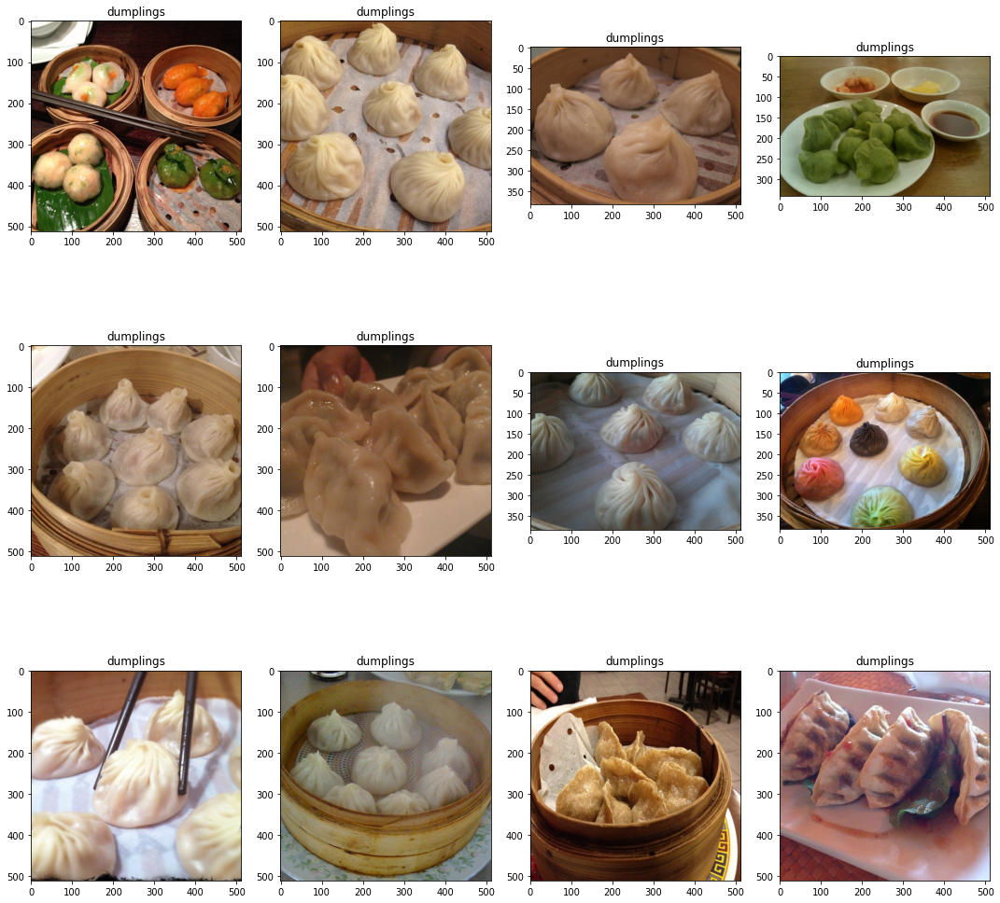

In [ ]:
# Visualizing Dumpling samples from the dataset
plt.figure(figsize = (15,15))

for i in range(12):
    plt.subplot(3, 4, i + 1)
    x = random.randint(0, len(d))
    path = '/content/dataset/food_5/images/dumplings/' + d[x]
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('Dumplings')

plt.tight_layout()
plt.show()

### Visualizing Lasagna samples from the dataset

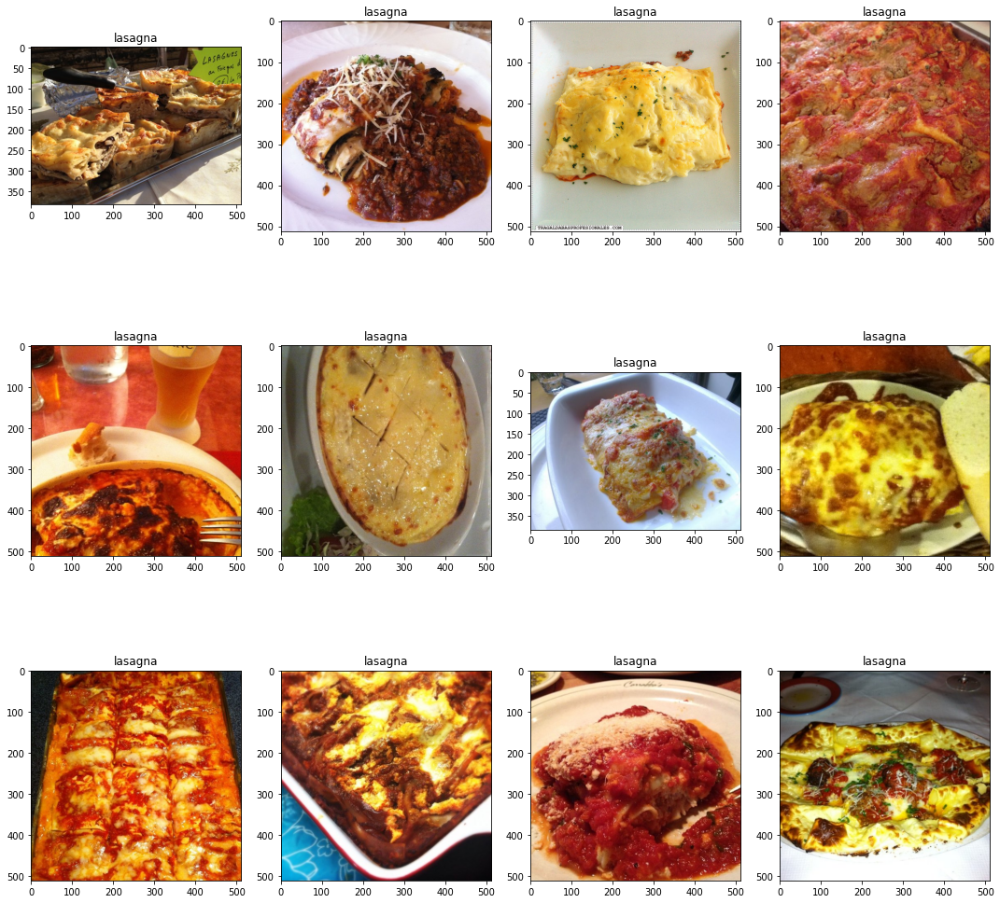

In [ ]:
# Visualizing Lasagna samples from the dataset
plt.figure(figsize = (15,15))

for i in range(12):
    plt.subplot(3, 4, i + 1)
    x = random.randint(0, len(la))
    path = '/content/dataset/food_5/images/lasagna/' + la[x]
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('Lasagna')

plt.tight_layout()
plt.show()

### Visualizing Macarons samples from the dataset

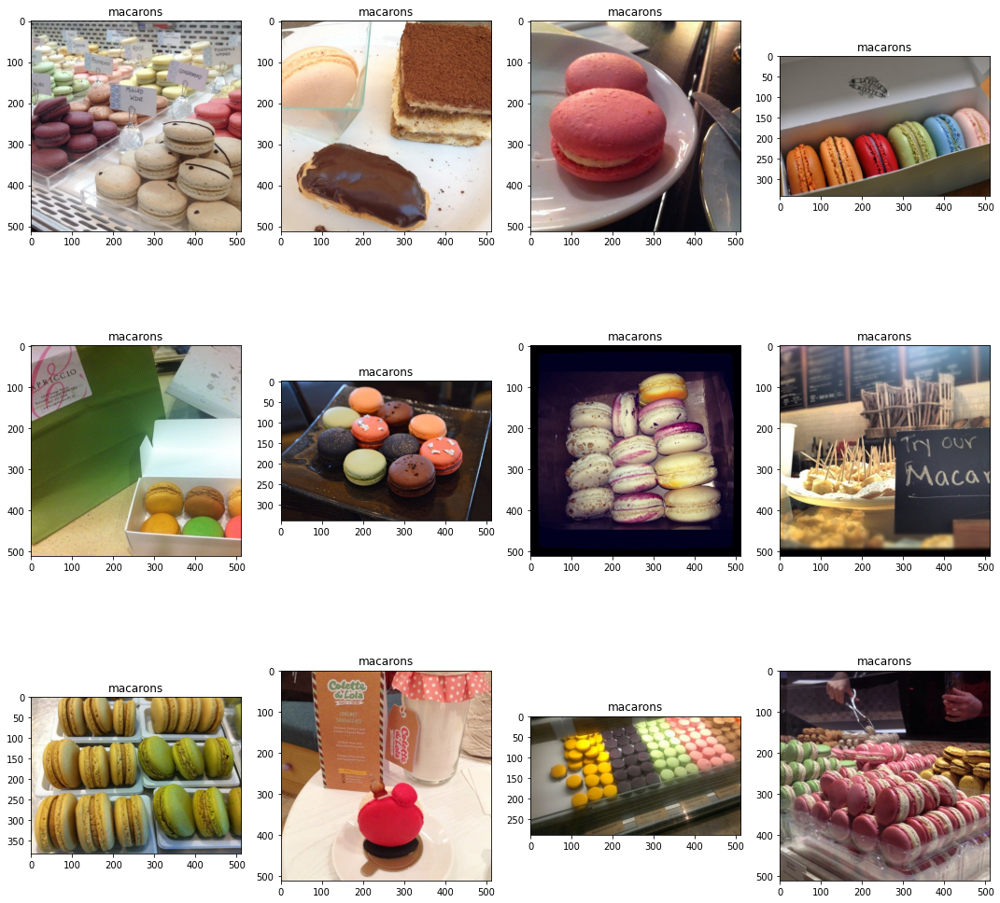

In [ ]:
# Visualizing Macaron samples from the dataset
plt.figure(figsize = (15,15))

for i in range(12):
    plt.subplot(3, 4, i + 1)
    x = random.randint(0, len(ma))
    path = '/content/dataset/food_5/images/macarons/' + ma[x]
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('Macarons')

plt.tight_layout()
plt.show()

### Visualizing some Red Velvet Cake samples from the dataset

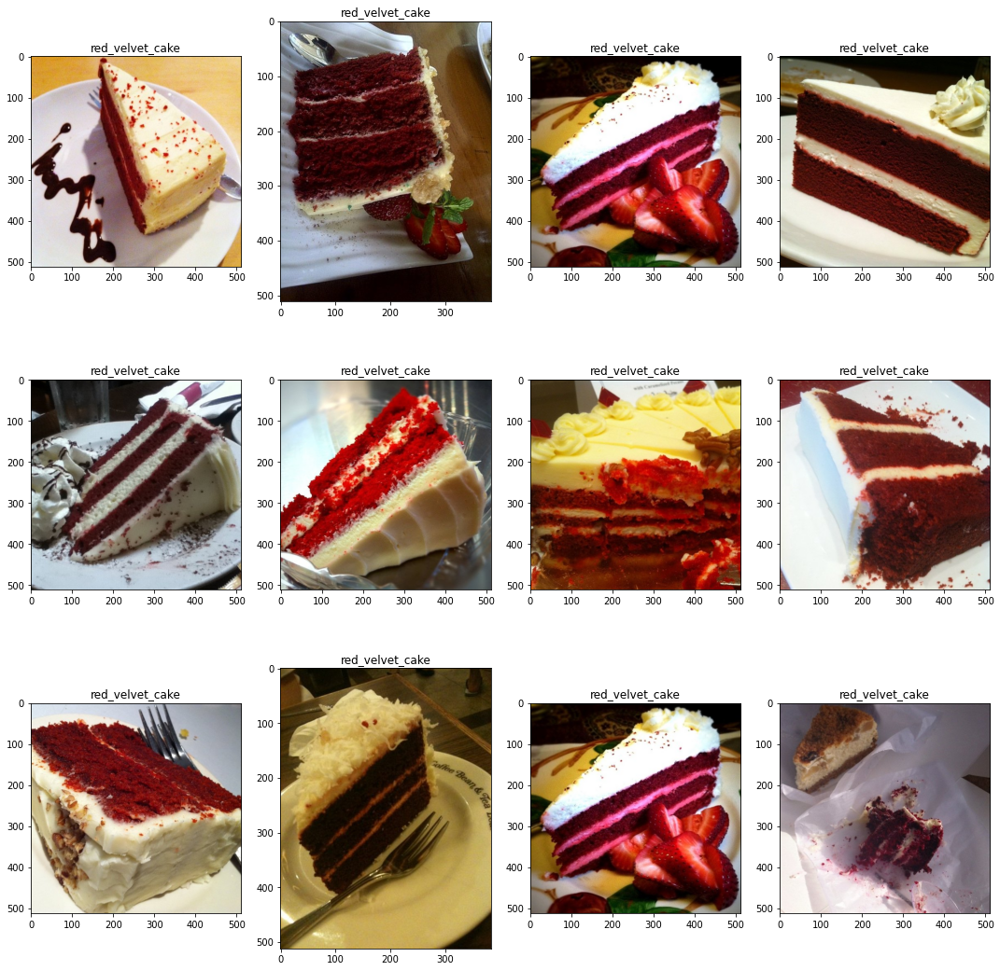

In [ ]:
# Visualizing Red Velvet Cake samples from the dataset
plt.figure(figsize = (15,15))

for i in range(12):
    plt.subplot(3, 4, i + 1)
    x = random.randint(0, len(rv))
    path = '/content/dataset/food_5/images/red_velvet_cake/' + rv[x]
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('Red Velvet Cake')

plt.tight_layout()
plt.show()

### Visualizing Waffles samples from the dataset

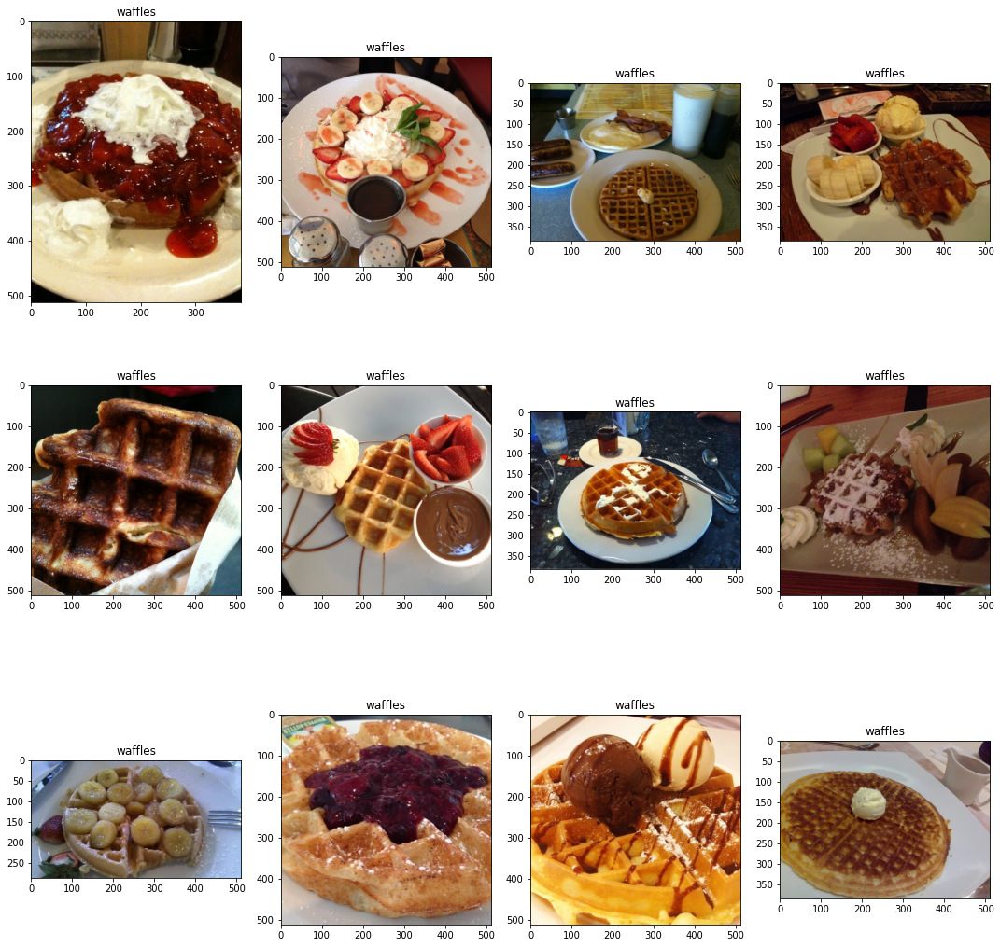

In [ ]:
# Visualizing Waffles samples from the dataset
plt.figure(figsize = (15,15))

for i in range(12):
    plt.subplot(3, 4, i + 1)
    x = random.randint(0, len(w))
    path = '/content/dataset/food_5/images/waffles/' + w[x]
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('waffles')

plt.tight_layout()
plt.show()

## Splitting the dataset into train, validation and test sets

We use the [split-folders](https://pypi.org/project/split-folders/) library to split the dataset into train, validation and test sets. For this, we need to specify the path to the original dataset (the `dataset/food_5/images/` folder) and the path to the folder with the split dataset (the `dataset_split` folder).

We then call the split-folders library using the 2 paths defined above, along with a seed (to give the exact same folder splits every time you split the dataset) and a ratio for the splitting the dataset (ratio format: train, val, test). For the given task, we used a split ratio of 80:10:10 for the train:val:test set.

In [ ]:
# Splitting dataset into train, validation and test sets
!pip install split-folders

import splitfolders

orig_path = '/content/dataset/food_5/images/'
output_path = '/content/dataset_split/'
splitfolders.ratio(orig_path, output = output_path, seed = 254, ratio = (.80, .10,.10))

Copying files: 5000 files [00:00, 5221.04 files/s]


Let us check the number of images in each of the sets we created.

In [ ]:
# Counting number of images
total_train = 0
for root, dirs, files in os.walk('/content/dataset_split/train'):
    total_train += len(files)
print('Train set size: ', total_train)

total_val = 0
for root, dirs, files in os.walk('/content/dataset_split/val'):
    total_val += len(files)
print('Validation set size: ', total_val)

total_test = 0
for root, dirs, files in os.walk('/content/dataset_split/test'):
    total_test += len(files)
print('Test set size: ', total_test)

Train set size:  4000
Validation set size:  500
Test set size:  500


## Setting up the Model Training

We now move on to preparing the model training stage. This is the most important aspect of our task. We will be using an [MobileNet](https://arxiv.org/abs/1610.02357) model from [Keras Applications](https://keras.io/api/applications/), through [keras.applications.mobilenet](https://keras.io/api/applications/xception/)

Let us begin by importing the required libraries

In [ ]:
import numpy as np
from tensorflow.keras.applications.mobilenet import MobileNet
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers
from tensorflow.keras import callbacks

Next, we define the train set and validation test paths

In [ ]:
train_data_path = '/content/dataset_split/train'
validation_data_path = '/content/dataset_split/val'

Now, we define some training hyperparameters:

*   img_width: Width of input image in pixels
*   img_height: Height of input image in pixels
*   channels: Numbers of color channels in image
*   batch_size: The number of training samples to work through before the model’s internal parameters are updated 
*   validation_steps: validation_set_size / batch_size
*   classes_num: Number of classes, 3 in our case
*   lr: Learning Rate. The learning rate is a hyperparameter that controls how much to change the model in response to the estimated error each time the model weights are updated. It  controls how quickly the model is adapted to the problem
*   epochs: The number of epochs controls the number of complete passes through the training dataset


In [ ]:
img_width = 224
img_height = 224
channels = 3
batch_size = 16
classes_num = 5
epochs = 50

We then define our training and validation generators using the defined hyperparameters. More information on this available [here](https://keras.io/api/preprocessing/image/).

ImageDataGenerator: Generate batches of tensor image data with real-time data augmentation. Read more [here](https://www.pyimagesearch.com/2019/07/08/keras-imagedatagenerator-and-data-augmentation/).

train_generator: Takes the path to a directory & generates batches of augmented data for training, based on the train image data generator.

validation_generator: Takes the path to a directory & generates batches of augmented data for validation, based on the validation image data generator.




In [ ]:
# Image data generators for train and val sets
train_datagen = ImageDataGenerator(
    rotation_range = 20,
    zoom_range = 0.15,
    width_shift_range = 0.2,
    height_shift_range = 0.2,
    shear_range = 0.15,
    horizontal_flip = True,
    fill_mode="nearest",rescale = 1. / 255)
val_datagen = ImageDataGenerator(rescale = 1. / 255)

# Training generator
train_generator = train_datagen.flow_from_directory(
    train_data_path,
    target_size = (img_height, img_width),
    batch_size = batch_size,
    class_mode = 'categorical')

# Validation generator
validation_generator = val_datagen.flow_from_directory(
    validation_data_path,
    target_size = (img_height, img_width),
    batch_size = batch_size,
    class_mode = 'categorical')

Found 4000 images belonging to 5 classes.
Found 500 images belonging to 5 classes.


We now define our MobileNet model. The input shape uses the same image height, image width and number of channels that we defined earlier. We use `imagenet` weights as the starting weights and exclude the top layer, in order to train the model for our custom number of classes.

In [ ]:
base_mobilenet = MobileNet(
    input_shape=None,
    alpha=1.0,
    depth_multiplier=1,
    dropout=0.001,
    include_top=True,
    weights="imagenet",
    input_tensor=None,
    pooling=None,
    classes=1000,
    classifier_activation="softmax"
)

Let us take a look at our base model, without the final few layers.

In [ ]:
base_mobilenet.summary()

Model: "mobilenet_1.00_224"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv1 (Conv2D)               (None, 112, 112, 32)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 112, 112, 32)      128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 112, 112, 32)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)      288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 112, 112, 32)      128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, 112, 112, 32

Then, we add a few more layers to the base model and use a softmax layer with 3 outputs as the final layer, for the 3 classes in our task.

Let us then take a look at our final model architecture summary!



In [ ]:
x = Dense(2048,activation='relu')(base_mobilenet.output)
x = Dense(128,activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(64,activation='relu')(x)
x = Dense(5,activation='softmax')(x)
mobilenet_net = Model(inputs = base_mobilenet.input, outputs = x)

mobilenet_net.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv1 (Conv2D)               (None, 112, 112, 32)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 112, 112, 32)      128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 112, 112, 32)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)      288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 112, 112, 32)      128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, 112, 112, 32)      0   

## Optimizer and Callbacks

Now that we have our model architecture ready, we need to define the other aspects of training like an optimizer and the callbacks.

An [optimizer](https://keras.io/api/optimizers/) is a method or algorithm to update the various parameters that can reduce the loss in much less effort. One of the most commonly used and best optimizers is [Adam](https://keras.io/api/optimizers/adam/).

In [ ]:
adam = optimizers.Adam(lr = 0.001, beta_1 = 0.9, beta_2 = 0.999, epsilon = 1e-5)

mobilenet_net.compile(loss = 'categorical_crossentropy',
              optimizer = adam,
              metrics = ['accuracy'])

Next, we create a directory to save our model weights. We create a `snapshots` folder in the Google Colaboratory environment for this purpose. However, please note that like the extracted dataset, these weights will be deleted once your session terminates.

Thus, if you have ample space in your Google Drive, you can temporarily save your model weights there. After the training is complete, you can sleect the best weights and the discard the others. For our task, we created a `snapshots` folder within the `Recipe Classification` folder we created in our Google Drive earlier, which we used to store our dataset in. 

In case you do not have enough space in Google Drive, you can proceed with storing your model weights in the Google Coloboratory environment and then copy the best weights to your Google Drive, after the training process.

In [ ]:
target_dir = './snapshots'

if not os.path.exists(target_dir):
  os.mkdir(target_dir)

Here, we define our model callbacks. A [callback](https://keras.io/api/callbacks/) is an object that can perform actions at various stages of training (e.g. at the start or end of an epoch, before or after a single batch, etc).

*   [checkpoints](https://keras.io/api/callbacks/model_checkpoint/): A callback to save the Keras model or model weights at some frequency It is used in conjunction with training using model.fit() to save a model or weights (in a checkpoint file) at some interval, so the model or weights can be loaded later to continue the training from the state saved. We will be saving the best weights only, based on validation loss.

*   [lr_op](https://keras.io/api/callbacks/reduce_lr_on_plateau/): Reduce learning rate on plateau, a metric has stopped improving. Models often benefit from reducing the learning rate by a factor of 2-10 once learning stagnates. This callback monitors a quantity and if no improvement is seen for a 'patience' number of epochs, the learning rate is reduced. We will be monitoring the validation loss stagnation over a period of 5 epochs (patience = 5) and reduce the learning rate by a factor of 0.1 (factor = 0.1) upon a learning plateau.

*   [early_stop](https://keras.io/api/callbacks/early_stopping/): Early stopping stops training when a monitored metric has stopped improving. Our model.fit() training loop will check at end of every epoch whether the validation loss is no longer decreasing, considering the min_delta and patience if applicable. Once it's found no longer decreasing, model.stop_training is marked True and the training terminates. We will be monitoring the validation loss improvement over a period of 10 epochs (patience = 10).


In [ ]:
# Directory to store training logs
log_dir = './tf-log/'

# Path tp store trained weights. Uncomment the needed one and comment out the other
### Google Drive
file_path = '/content/gdrive/MyDrive/MobileNet/snapshots/best_weight{epoch:03d}.h5'

'''
### Google Colaboratory environment
file_path = '/content/snapshots/best_weight{epoch:03d}.h5'
'''

# Checkpoints
checkpoints = callbacks.ModelCheckpoint(file_path, monitor = "val_loss", verbose = 0, save_best_only = True, mode = 'auto')

# Reduce learning rate on plateau
lr_op = callbacks.ReduceLROnPlateau(monitor = "val_loss", factor = 0.1, patience = 5,
  verbose = 1, mode = "auto", cooldown = 0,
  min_lr = 1e-30)

# Early stopping
early_stop = callbacks.EarlyStopping(
    monitor = "val_loss",
    min_delta = 0,
    patience = 10,
    verbose = 1,
    mode = "auto",
    baseline = None,
    restore_best_weights = False,
)

# Add all the created callbacks
cbks = [checkpoints, lr_op, early_stop]

## Model Training

Finally, we can begin with our model trainig. We call the fit() method for this purpose. We pass the train and validation generators, number of epochs, callbacks, steps_per_epochs (train_set_size / batch_size), validation_steps(validation_set_size / batch_size).

In [ ]:
# Model training
history = mobilenet_net.fit(
    train_generator,
    steps_per_epoch = 250,
    epochs = 110,
    validation_data = validation_generator,
    callbacks = cbks,
    validation_steps = 32)

Epoch 1/110
250/250 [==============================] - 62s 248ms/step - loss: 0.2657 - accuracy: 0.9205 - val_loss: 0.2536 - val_accuracy: 0.9260
Epoch 2/110
250/250 [==============================] - 62s 247ms/step - loss: 0.2407 - accuracy: 0.9230 - val_loss: 0.2542 - val_accuracy: 0.9280
Epoch 3/110
250/250 [==============================] - 62s 246ms/step - loss: 0.2543 - accuracy: 0.9243 - val_loss: 0.2445 - val_accuracy: 0.9300
Epoch 4/110
250/250 [==============================] - 62s 248ms/step - loss: 0.2329 - accuracy: 0.9280 - val_loss: 0.2398 - val_accuracy: 0.9340
Epoch 5/110
250/250 [==============================] - 62s 248ms/step - loss: 0.2315 - accuracy: 0.9255 - val_loss: 0.2450 - val_accuracy: 0.9300
Epoch 6/110
250/250 [==============================] - 62s 246ms/step - loss: 0.2270 - accuracy: 0.9285 - val_loss: 0.2388 - val_accuracy: 0.9260
Epoch 7/110
250/250 [==============================] - 62s 249ms/step - loss: 0.2317 - accuracy: 0.9265 - val_loss: 0.2339 -

## Training Statistics

We have now trained our model and have our weights saved in the selected `snapshots` folder. Kindly store these weights safely, as you will need them in the future to perform inferences.

Let us see the training statistics. This will help us select the best model. The validation loss is a good metric to select the best weights. Since we have checkpointed the weights based on the best validation loss, the last saved weights will most likely be the best one. In this case, it was the weights of the 11th epoch.

In [ ]:
training_stats = history.history
print(training_stats)

NameError: ignored

## Best Model Weights Statistics

*   Train Loss: 0.1776
*   Train Accuracy: 0.9413
*   Val Loss: 0.2347
*   Val Accuracy: 0.9320

## Plotting Graphs

Let us visualize the graphs for train loss, train accuracy, validation loss, validation accuracy.

The loss graphs should ideally show a gradual decrease, while the accuracy graphs should ideally show a gradual increase.

### Train Loss

We can see the train loss starting at a very high value initially. As the number of epochs increase, the model learns and the train loss decreases after some initial instabilty. 

Text(0.5, 1.0, 'Train loss')

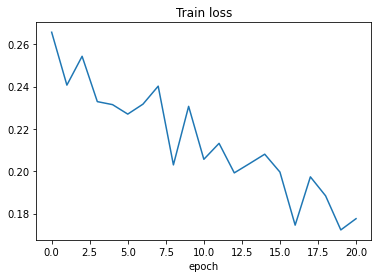

In [ ]:
plt.plot(training_stats['loss'])
plt.xlabel('epoch')
plt.title('Train loss')

### Train Accuracy
We can see the train accuracy starting at a very low value initially. As the number of epochs increase, the model learns and the train accuracy increases after some initial instabilty. 

Text(0.5, 1.0, 'Train Accuracy')

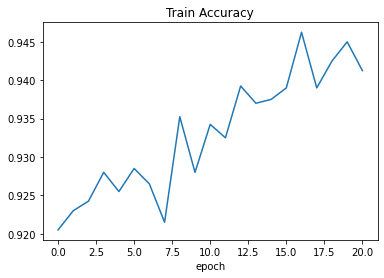

In [ ]:
plt.plot(training_stats['accuracy'])
plt.xlabel('epoch')
plt.title('Train Accuracy')

### Validation Loss

We can see the validation loss being very unstable and exploding to a very high value initially. As the number of epochs increase, the model learns and the validation loss decreases after some initial instabilty.

Text(0.5, 1.0, 'Validation loss')

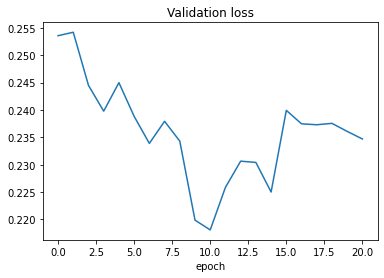

In [ ]:
plt.plot(training_stats['val_loss'])
plt.xlabel('epoch')
plt.title('Validation loss')

### Validation Accuracy

We can see the validation accuracy starting at a very low value initially and acting very unstable. As the number of epochs increase, the model learns and the validation accuracy increases after some initial instabilty.

Text(0.5, 1.0, 'Validation Accuracy')

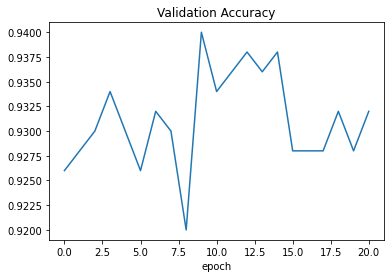

In [ ]:
plt.plot(training_stats['val_accuracy'])
plt.xlabel('epoch')
plt.title('Validation Accuracy')

### Combining train and validation graphs

Let us visualize the train and validation graphs together for comparison. The blue line represents the train metric and the orange line represents the validation metric. 

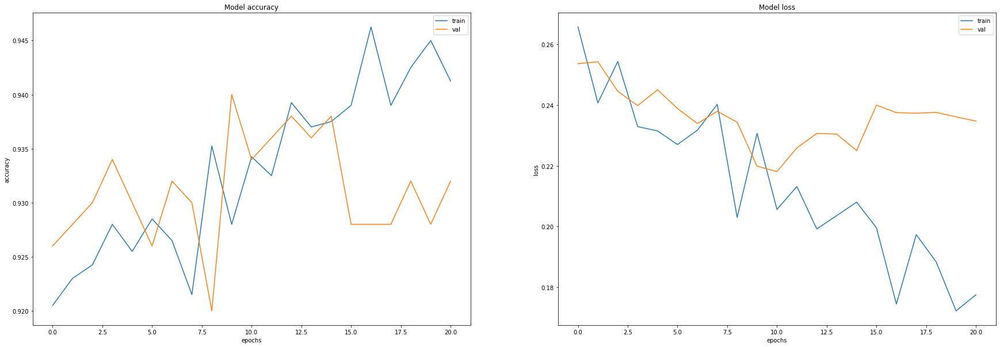

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(30, 10))
ax = ax.ravel()

for i, metric in enumerate(["accuracy", "loss"]):
    ax[i].plot(mobilenet_net.history.history[metric][:])
    ax[i].plot(mobilenet_net.history.history["val_" + metric][:])
    ax[i].set_title("Model {}".format(metric))
    ax[i].set_xlabel("epochs")
    ax[i].set_ylabel(metric)
    ax[i].legend(["train", "val"])

## Testing the model

It is now time to test our trained model using our test set! We will also plot the incorrectly classified images to get an idea of where and why the model might be misclassifying.

As always, we first import the needed packages.

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img,img_to_array

Next, we load the model from our best weights. In this case, the weights of the 11th epoch were the best. They are stored in the `snapshots` directory within the `MobileNet` folder on our mounted Google Drive.

In [ ]:
# Load model
model = load_model('/content/gdrive/MyDrive/MobileNet/snapshots/best_weight011.h5')

### Testing for Dumpling samples

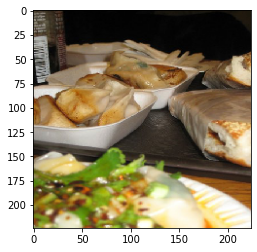

Predicted class probability for image:  0.3490628
Predicted Class : waffles


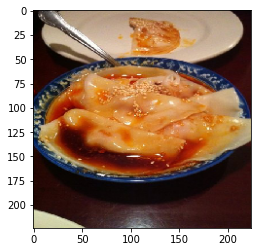

Predicted class probability for image:  0.9500504
Predicted Class : lasagna


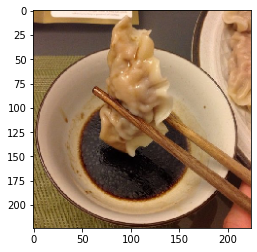

Predicted class probability for image:  0.5444953
Predicted Class : waffles


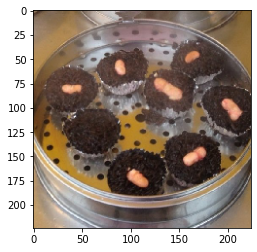

Predicted class probability for image:  0.63553196
Predicted Class : red_velvet_cake


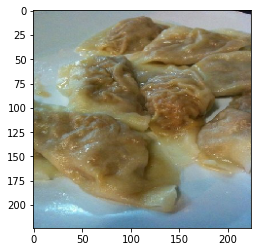

Predicted class probability for image:  0.4822151
Predicted Class : waffles


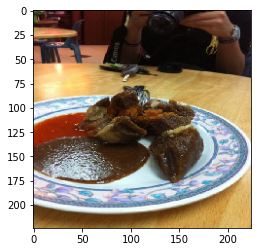

Predicted class probability for image:  0.4101988
Predicted Class : waffles


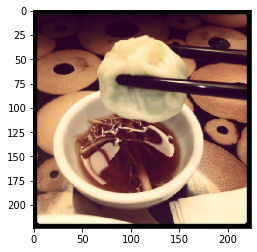

Predicted class probability for image:  0.6920749
Predicted Class : red_velvet_cake


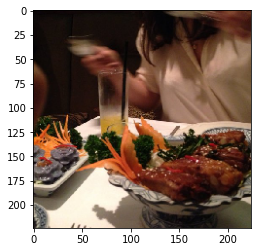

Predicted class probability for image:  0.43559977
Predicted Class : waffles


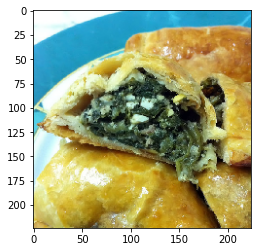

Predicted class probability for image:  0.48872238
Predicted Class : lasagna


In [ ]:
# Testing for Dumpling samples
class_dict = {0: 'dumplings', 1: 'lasagna', 2: 'macarons', 3: 'red_velvet_cake', 4: 'waffles'}
dumplings_count = 0

food_d = os.listdir('dataset_split/test/dumplings')

for img in food_d:
    img_path = 'dataset_split/test/dumplings/' + img
    img = load_img(img_path, target_size = (224,224))
    img_tensor = img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)    
    img_tensor /= 255. 

    ### predict() takes image tensor of (batchsize,heighht,width,channels)  
    ### Returns an array for all images in batch with probability for each class 
    pred = model.predict(img_tensor)
  
    classes = np.argmax(pred)

    if classes == 0:
      dumplings_count += 1
    else:
      plt.imshow(img_tensor[0])
      plt.show()
      print('Predicted class probability for image: ', pred[0][classes])
        
      ### Class number with highest probablity (Classification result of CNN)  
      print('Predicted Class :', class_dict[classes])

Let us calculate the test accuracy for Dumplings samples.

In [ ]:
print('Test size for dumplings: ', len(food_d))
print('Correctly classifed as dumplings:', dumplings_count)
print('Incorrectly classified images:', len(food_d) - dumplings_count)
print('Accuracy:', (dumplings_count / len(food_d)) * 100)

Test size for dumplings:  100
Correctly classifed as dumplings: 91
Incorrectly classified images: 9
Accuracy: 91.0


### Testing for Lasagna samples

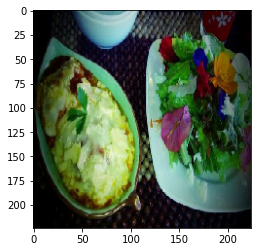

Predicted class probability for image:  0.5156457
Predicted Class : red_velvet_cake


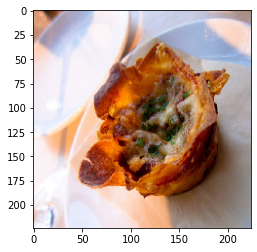

Predicted class probability for image:  0.56184745
Predicted Class : waffles


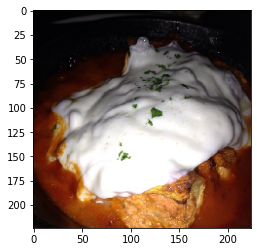

Predicted class probability for image:  0.97064036
Predicted Class : waffles


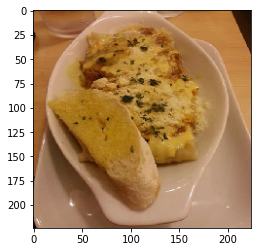

Predicted class probability for image:  0.56171244
Predicted Class : waffles


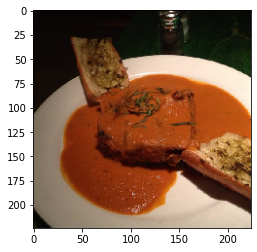

Predicted class probability for image:  0.5328059
Predicted Class : waffles


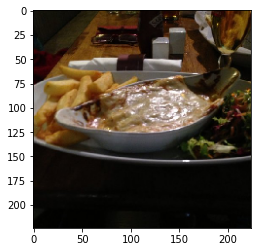

Predicted class probability for image:  0.7955255
Predicted Class : waffles


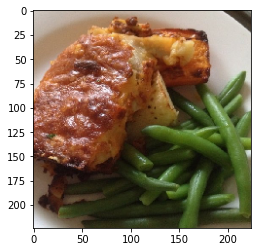

Predicted class probability for image:  0.97736186
Predicted Class : waffles


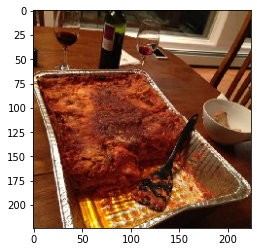

Predicted class probability for image:  0.5583361
Predicted Class : red_velvet_cake


In [ ]:
# Testing for Lasagna samples
class_dict = {0: 'dumplings', 1: 'lasagna', 2: 'macarons', 3: 'red_velvet_cake', 4: 'waffles'}
lasagna_count = 0

food_la = os.listdir('dataset_split/test/lasagna')

for img in food_la:
    img_path = 'dataset_split/test/lasagna/' + img
    img = load_img(img_path, target_size = (224,224))
    img_tensor = img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)    
    img_tensor /= 255. 

    ### predict() takes image tensor of (batchsize,heighht,width,channels)  
    ### Returns an array for all images in batch with probability for each class 
    pred = model.predict(img_tensor)
  
    classes = np.argmax(pred)

    if classes == 1:
      lasagna_count += 1
    else:
      plt.imshow(img_tensor[0])
      plt.show()
      print('Predicted class probability for image: ', pred[0][classes])
        
      ### Class number with highest probablity (Classification result of CNN)  
      print('Predicted Class :', class_dict[classes])

Let us calculate the test accuracy for Lasagna samples.

In [ ]:
print('Test size for lasagna: ', len(food_la))
print('Correctly classifed as lasagna:', lasagna_count)
print('Incorrectly classified images:', len(food_la) - lasagna_count)
print('Accuracy:', (lasagna_count / len(food_la)) * 100)

Test size for lasagna:  100
Correctly classifed as lasagna: 92
Incorrectly classified images: 8
Accuracy: 92.0


### Testing for Macarons samples

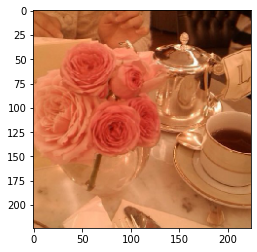

Predicted class probability for image:  0.84523696
Predicted Class : dumplings


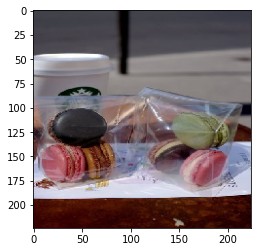

Predicted class probability for image:  0.71382505
Predicted Class : waffles


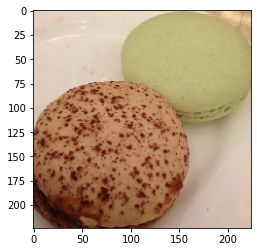

Predicted class probability for image:  0.95209324
Predicted Class : lasagna


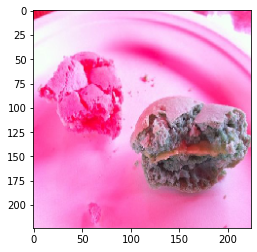

Predicted class probability for image:  0.42350468
Predicted Class : red_velvet_cake


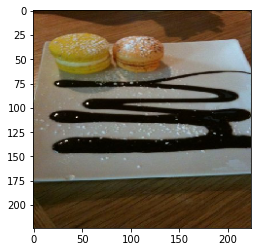

Predicted class probability for image:  0.72152907
Predicted Class : red_velvet_cake


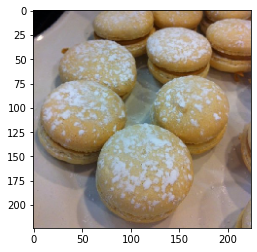

Predicted class probability for image:  0.47350004
Predicted Class : dumplings


In [ ]:
# Testing for Macarons samples
class_dict = {0: 'dumplings', 1: 'lasagna', 2: 'macarons', 3: 'red_velvet_cake', 4: 'waffles'}
macarons_count = 0

food_ma = os.listdir('dataset_split/test/macarons')

for img in food_ma:
    img_path = 'dataset_split/test/macarons/' + img
    img = load_img(img_path, target_size = (224,224))
    img_tensor = img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)    
    img_tensor /= 255. 

    ### predict() takes image tensor of (batchsize,heighht,width,channels)  
    ### Returns an array for all images in batch with probability for each class 
    pred = model.predict(img_tensor)
  
    classes = np.argmax(pred)

    if classes == 2:
      macarons_count += 1
    else:
      plt.imshow(img_tensor[0])
      plt.show()
      print('Predicted class probability for image: ', pred[0][classes])
        
      ### Class number with highest probablity (Classification result of CNN)  
      print('Predicted Class :', class_dict[classes])

Let us calculate the test accuracy for Macarons samples.

In [ ]:
print('Test size for macarons: ', len(food_ma))
print('Correctly classifed as macarons:', macarons_count)
print('Incorrectly classified images:', len(food_ma) - macarons_count)
print('Accuracy:', (macarons_count / len(food_ma)) * 100)

Test size for macarons:  100
Correctly classifed as macarons: 94
Incorrectly classified images: 6
Accuracy: 94.0


### Testing for RedVelvetCake samples

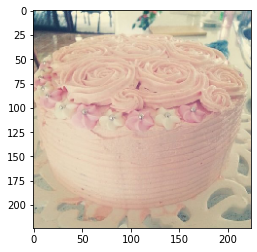

Predicted class probability for image:  0.3879382
Predicted Class : macarons


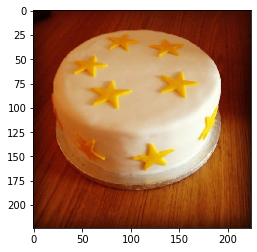

Predicted class probability for image:  0.7136613
Predicted Class : waffles


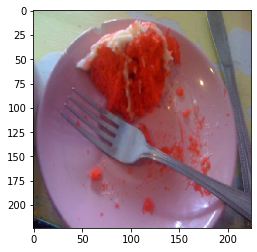

Predicted class probability for image:  0.71090287
Predicted Class : lasagna


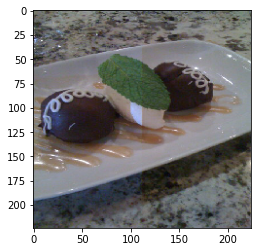

Predicted class probability for image:  0.47689632
Predicted Class : lasagna


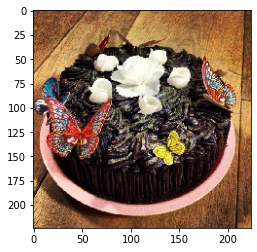

Predicted class probability for image:  0.63635546
Predicted Class : waffles


In [ ]:
# Testing for Red Velvet Cake samples
class_dict = {0: 'dumplings', 1: 'lasagna', 2: 'macarons', 3: 'red_velvet_cake', 4: 'waffles'}
red_velvet_cake_count = 0

food_rv = os.listdir('dataset_split/test/red_velvet_cake')

for img in food_rv:
    img_path = 'dataset_split/test/red_velvet_cake/' + img
    img = load_img(img_path, target_size = (224,224))
    img_tensor = img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)    
    img_tensor /= 255. 

    ### predict() takes image tensor of (batchsize,heighht,width,channels)  
    ### Returns an array for all images in batch with probability for each class 
    pred = model.predict(img_tensor)
  
    classes = np.argmax(pred)

    if classes == 3:
      red_velvet_cake_count += 1
    else:
      plt.imshow(img_tensor[0])
      plt.show()
      print('Predicted class probability for image: ', pred[0][classes])
        
      ### Class number with highest probablity (Classification result of CNN)  
      print('Predicted Class :', class_dict[classes])

In [ ]:
print('Test size for red_velvet_cake: ', len(food_rv))
print('Correctly classifed as red_velvet_cake:', red_velvet_cake_count)
print('Incorrectly classified images:', len(food_rv) - red_velvet_cake_count)
print('Accuracy:', (red_velvet_cake_count / len(food_rv)) * 100)

Test size for red_velvet_cake:  100
Correctly classifed as red_velvet_cake: 95
Incorrectly classified images: 5
Accuracy: 95.0


### Testing for Waffles samples

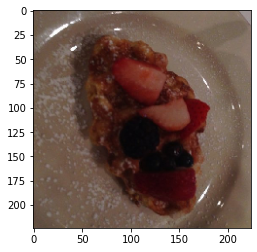

Predicted class probability for image:  0.7139654
Predicted Class : lasagna


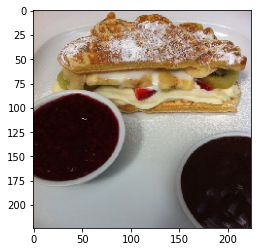

Predicted class probability for image:  0.34871683
Predicted Class : red_velvet_cake


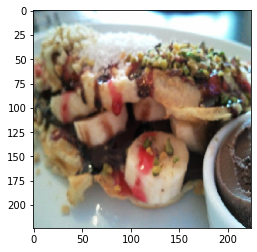

Predicted class probability for image:  0.8072431
Predicted Class : lasagna


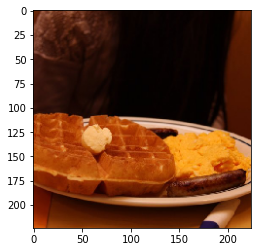

Predicted class probability for image:  0.39502665
Predicted Class : macarons


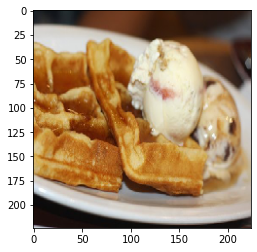

Predicted class probability for image:  0.7460327
Predicted Class : dumplings


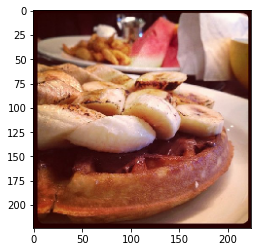

Predicted class probability for image:  0.7358918
Predicted Class : macarons


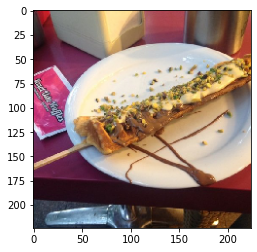

Predicted class probability for image:  0.8474039
Predicted Class : lasagna


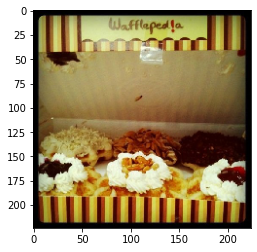

Predicted class probability for image:  0.9694157
Predicted Class : macarons


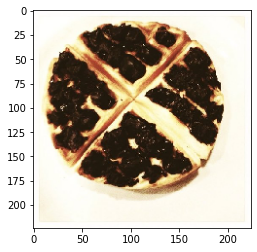

Predicted class probability for image:  0.41229635
Predicted Class : red_velvet_cake


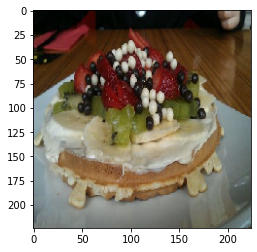

Predicted class probability for image:  0.50763714
Predicted Class : red_velvet_cake


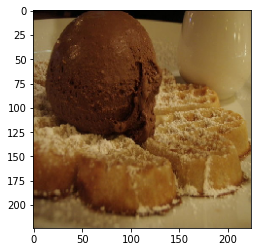

Predicted class probability for image:  0.8845714
Predicted Class : macarons


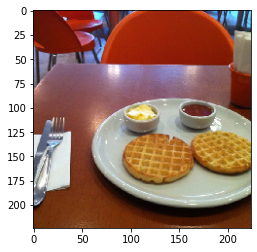

Predicted class probability for image:  0.7166236
Predicted Class : dumplings


In [ ]:
# Testing for Waffle samples
class_dict = {0: 'dumplings', 1: 'lasagna', 2: 'macarons', 3: 'red_velvet_cake', 4: 'waffles'}
waffles_count = 0

food_w = os.listdir('dataset_split/test/waffles')

for img in food_w:
    img_path = 'dataset_split/test/waffles/' + img
    img = load_img(img_path, target_size = (224,224))
    img_tensor = img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)    
    img_tensor /= 255. 

    ### predict() takes image tensor of (batchsize,heighht,width,channels)  
    ### Returns an array for all images in batch with probability for each class 
    pred = model.predict(img_tensor)
  
    classes = np.argmax(pred)

    if classes == 4:
      waffles_count += 1
    else:
      plt.imshow(img_tensor[0])
      plt.show()
      print('Predicted class probability for image: ', pred[0][classes])
        
      ### Class number with highest probablity (Classification result of CNN)  
      print('Predicted Class :', class_dict[classes])

In [ ]:
print('Test size for waffles: ', len(food_w))
print('Correctly classifed as waffles:', waffles_count)
print('Incorrectly classified images:', len(food_w) - waffles_count)
print('Accuracy:', (waffles_count / len(food_w)) * 100)

Test size for waffles:  100
Correctly classifed as waffles: 88
Incorrectly classified images: 12
Accuracy: 88.0
